## Vehicle Detection Project

The goals / steps of this project are the following:

- Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier.
- Apply a color transform and append binned color features, as well as histograms of color, and combine with HOG features.
- Normalize features and randomize a selection for training and testing.
- Implement a sliding-window technique and use the trained classifier to search for vehicles in images.
- Run the pipeline on a video stream and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
- Estimate a bounding box for vehicles detected.

In [1]:
# import all the necessary functions and libraries
import numpy as np
import cv2
import glob
from skimage.feature import hog
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC, SVC
import time
from scipy.ndimage.measurements import label
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
# dataset files
carImages = glob.glob('data/vehicles/**/*.png')
nonCarImages = glob.glob('data/non-vehicles/**/*.png')

print("There are {} car images in the dataset.".format(len(carImages)))
print("There are {} non car images in the dataset.".format(len(nonCarImages)))

There are 8792 car images in the dataset.
There are 8968 non car images in the dataset.


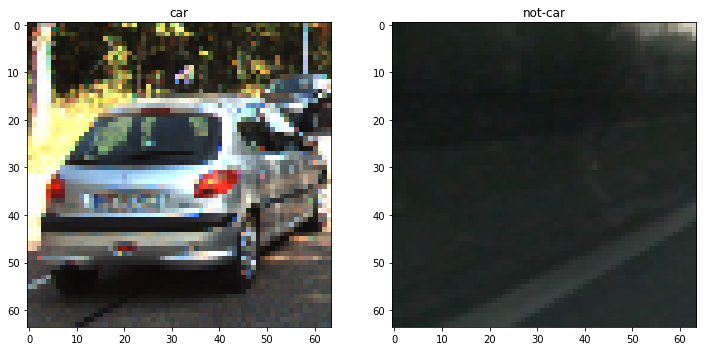

In [3]:
# visualise the car and not-car images
carImg = cv2.cvtColor(cv2.imread(carImages[np.random.randint(0, len(carImages))]), cv2.COLOR_BGR2RGB)
notCarImg = cv2.cvtColor(cv2.imread(nonCarImages[np.random.randint(0, len(nonCarImages))]), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(12, 9))

axes[0].imshow(carImg)
axes[0].set_title("car")

axes[1].imshow(notCarImg)
axes[1].set_title("not-car")

#### HOG and Color Features

For extracting a set of different features like histograms of color, binning of color and histograms of gradient (HOG), I have implemented a simple class to called `FeatureExtractor()` to store all the parameters for feature extraction pipeline.

In [4]:
class FeatureExtractor:
#     def __init__(self):
    # Bin spatial parameters
    binSize = (16, 16)
    # Histogram parameters
    histBins = 16
    histRange = (0, 256)
    # HOG parameters
    colorspace = "YUV"
    orient = 11
    pixPerCell = 16
    cellPerBlock = 2
    hogChannel = "ALL"
        
    @staticmethod
    def setParameters(histBins, histRange, binSize, colorspace, orient, pixPerCell, cellPerBlock, hogChannel):
        assert(hogChannel == 0 or hogChannel == 1 or hogChannel == 2 or hogChannel == "ALL")
        assert(colorspace == "RGB" or colorspace == "HSV" or colorspace == "YUV" or colorspace == "YCrCb" or
               colorspace == "HLS" or colorspace == "LUV")
        # Bin spatial parameters
        FeatureExtractor.binSize = binSize
        # Histogram parameters
        FeatureExtractor.histBins = histBins
        FeatureExtractor.histRange = histRange
        # HOG parameters
        FeatureExtractor.colorspace = colorspace
        FeatureExtractor.orient = orient
        FeatureExtractor.pixPerCell = pixPerCell
        FeatureExtractor.cellPerBlock = cellPerBlock
        FeatureExtractor.hogChannel = hogChannel
        
    @staticmethod
    def binSpatial(img):
        # Use cv2.resize().ravel() to create the feature vector
        features = cv2.resize(img, FeatureExtractor.binSize).ravel() 
        # Return the feature vector
        return features
    
    @staticmethod
    def colorHist(img):
        nbins = FeatureExtractor.histBins
        bins_range = FeatureExtractor.histRange
        # Compute the histogram of the color channels separately
        channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
        channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
        channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
        # Concatenate the histograms into a single feature vector
        hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
        # Return the individual histograms, bin_centers and feature vector
        return hist_features
    
    @staticmethod
    def getHogFeatures(img, vis=False, featureVec=True):
        orient = FeatureExtractor.orient
        pixPerCell = FeatureExtractor.pixPerCell
        cellPerBlock = FeatureExtractor.cellPerBlock
        # Call with two outputs if vis==True
        if vis == True:
            features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pixPerCell, pixPerCell),
                                      cells_per_block=(cellPerBlock, cellPerBlock), transform_sqrt=True, 
                                      visualise=vis, feature_vector=featureVec, block_norm='L2-Hys')
            return features, hog_image
        # Otherwise call with one output
        else:      
            features = hog(img, orientations=orient, pixels_per_cell=(pixPerCell, pixPerCell),
                           cells_per_block=(cellPerBlock, cellPerBlock), transform_sqrt=True, 
                           visualise=vis, feature_vector=featureVec, block_norm='L2-Hys')
        return features
    
    @staticmethod
    def extractFeatues(img):
        cspace = FeatureExtractor.colorspace
        
        # Convert image to new color space (if specified)
        if cspace != 'RGB':
            if cspace == 'HSV':
                featureImage = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                featureImage = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                featureImage = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                featureImage = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                featureImage = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        else:
            featureImage = np.copy(img)
        
        spatialFeat = FeatureExtractor.binSpatial(featureImage)
        histFeat = FeatureExtractor.colorHist(featureImage)
        
        hogChannel = FeatureExtractor.hogChannel
        orient = FeatureExtractor.orient
        pixPerCell = FeatureExtractor.pixPerCell
        cellPerBlock = FeatureExtractor.cellPerBlock
        # Call get_hog_features() with vis=False, feature_vec=True
        if hogChannel == 'ALL':
            hogFeat = []
            for channel in range(featureImage.shape[2]):
                hogFeat.append(FeatureExtractor.getHogFeatures(featureImage[:,:,channel], vis=False, featureVec=True))
            hogFeat = np.ravel(hogFeat)        
        else:
            hogFeat = FeatureExtractor.getHogFeatures(featureImage[:,:,hogChannel], vis=False, featureVec=True)
        
        # Finally, return the concatenated list
        return np.concatenate((spatialFeat, histFeat, hogFeat))
        # return hogFeat
    
    @staticmethod
    def createFeatureList(imgList):
        # Create a list to append feature vectors to
        features = []
        for file in imgList:
            img = cv2.imread(file)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            imgFeatures = FeatureExtractor.extractFeatues(img)
            features.append(imgFeatures)
        
        # Finally, return the features
        return features

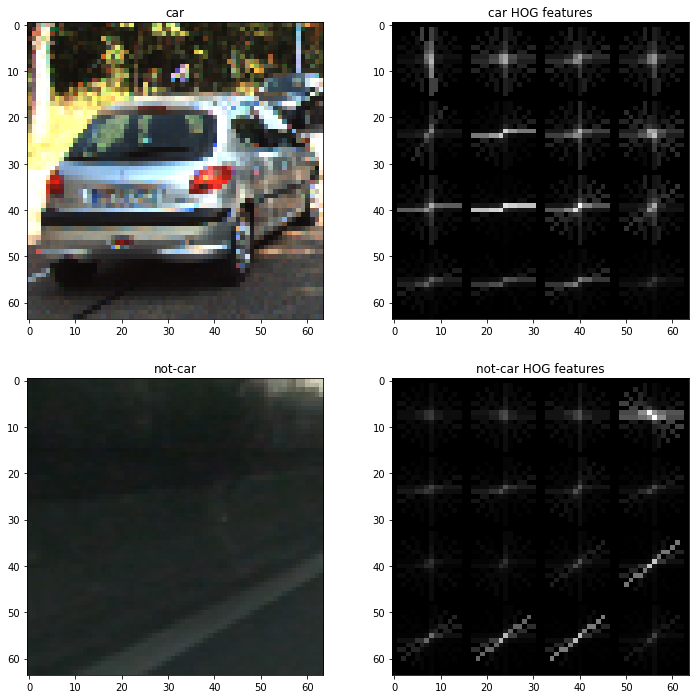

In [5]:
_, carHogFeat = FeatureExtractor.getHogFeatures(carImg[:,:,1], vis=True)
_, nonCarHogFeat = FeatureExtractor.getHogFeatures(notCarImg[:,:,1], vis=True)

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

axes[0][0].imshow(carImg)
axes[0][0].set_title("car")

axes[0][1].imshow(carHogFeat, cmap='gray')
axes[0][1].set_title("car HOG features")

axes[1][0].imshow(notCarImg)
axes[1][0].set_title("not-car")

axes[1][1].imshow(nonCarHogFeat, cmap='gray')
axes[1][1].set_title("not-car HOG features")

The parameters chosen for the Feature Extractor are as below:

```
binSize = (16, 16)
histBins = 16
histRange = (0, 256)
colorspace = "YUV"
orient = 11
pixPerCell = 16
cellPerBlock = 2
hogChannel = "ALL"
```

These are selected while experimeting with the lecture code and yielded ~98.5% accuracy and relatively lesser training time than other combinations.

Now that having the parameters defined well, the next step is to create the train/test data to train a Linear SVM model. It is important to normalise the data before using it for training any classifier.


In [71]:
# Extract the features for car and non car images

t1 = time.time()

carFeatures = FeatureExtractor.createFeatureList(carImages)
nonCarFeatures = FeatureExtractor.createFeatureList(nonCarImages)

print("Took {} s to extract the features...".format(round(time.time() - t1, 2)))

# Array of feature vectors
X = np.vstack((carFeatures, nonCarFeatures)).astype(np.float64)
# Array of corresponding labels
Y = np.hstack((np.ones(len(carImages)), np.zeros(len(nonCarImages))))

# Normalise the features as they will not be in the same range
Xscalar = StandardScaler().fit(X)
Xnorm = Xscalar.transform(X)

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
Xtrain, Xtest, Ytrain, Ytest = train_test_split(
    Xnorm, Y, test_size=0.2, random_state=rand_state)

# Train a linear classifier
svc = LinearSVC(C=10)
t2 = time.time()
svc.fit(Xtrain, Ytrain)
print("Took {} s to train the Linear SVM classifier ...".format(round(time.time() - t2, 2)))

# Check the test accuracy of the classifier
print('Test Accuracy of SVC = {}'.format(round(svc.score(Xtest, Ytest), 4)))

Took 103.99 s to extract the features...
Took 6.48 s to train the Linear SVM classifier ...
Test Accuracy of SVC = 0.9887


### Sliding Window search

Now that the classifier is trained, and is known to perform pretty well on the test set, it is the time to test the prediction on the test image from the project video. In order detect cars from an image, a sliding window with overlaps can be implemented and features can be extracted for each of them.

In [7]:
# Load the list of test images
testImgFiles = glob.glob('test_images/*.jpg')

In [73]:
# These functions are taken as is from the course notes

# Basic functions provided on Udacity's course to creating windows and drawing boxes on an image.
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=5):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start = 0
    else:
        x_start = x_start_stop[0]
    if x_start_stop[1] == None:
        x_stop = img.shape[1]-1
    else:
        x_stop = x_start_stop[1]
    if y_start_stop[0] == None:
        y_start = 0
    else:
        y_start = y_start_stop[0]
    if y_start_stop[1] == None:
        y_stop = img.shape[0]-1
    else:
        y_stop = y_start_stop[1]
    
    x_start_stop = (x_start, x_stop)
    y_start_stop = (y_start, y_stop)
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

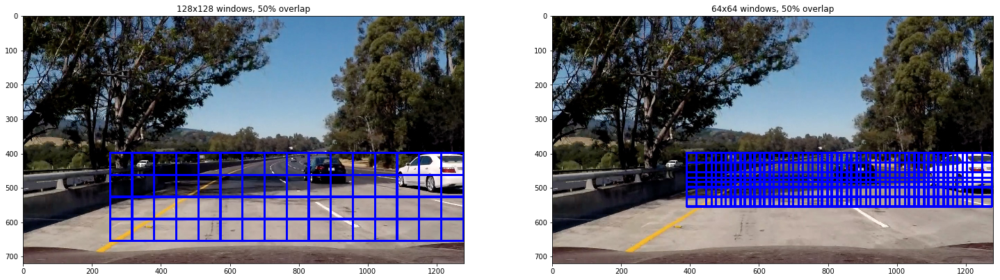

In [88]:
# Apply the sliding window for two different ranges of window sizes
image = cv2.cvtColor(cv2.imread(testImgFiles[1]), cv2.COLOR_BGR2RGB)
windows = []
windows.append(slide_window(image, x_start_stop=(252, None), y_start_stop=(398, 654), 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5)))
windows.append(slide_window(image, x_start_stop=(390, None), y_start_stop=(398, 572), 
                    xy_window=(72, 72), xy_overlap=(0.6, 0.6)))

windowImgs = []
windowImgs.append(draw_boxes(image, windows[0]))
windowImgs.append(draw_boxes(image, windows[1]))

fig, axes = plt.subplots(1, 2, figsize=(25, 8))

axes[0].imshow(windowImgs[0])
axes[0].set_title("128x128 windows, 50% overlap")

axes[1].imshow(windowImgs[1])
axes[1].set_title("64x64 windows, 50% overlap")

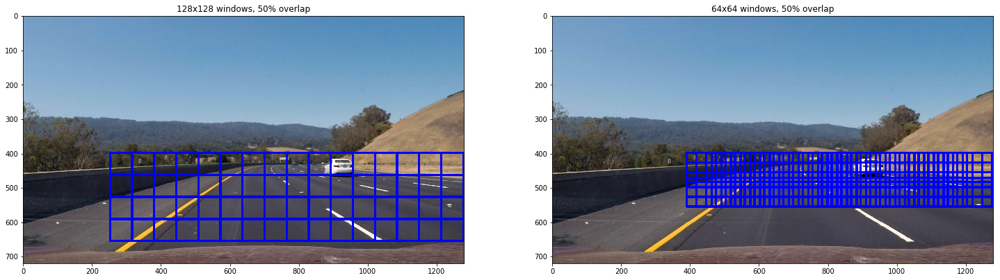

In [89]:
# Apply the sliding window for two different ranges of window sizes
image = cv2.cvtColor(cv2.imread(testImgFiles[4]), cv2.COLOR_BGR2RGB)
windows = []
windows.append(slide_window(image, x_start_stop=(252, None), y_start_stop=(398, 654), 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5)))
windows.append(slide_window(image, x_start_stop=(390, None), y_start_stop=(398, 572), 
                    xy_window=(72, 72), xy_overlap=(0.6, 0.6)))

windowImgs = []
windowImgs.append(draw_boxes(image, windows[0]))
windowImgs.append(draw_boxes(image, windows[1]))

fig, axes = plt.subplots(1, 2, figsize=(25, 8))

axes[0].imshow(windowImgs[0])
axes[0].set_title("128x128 windows, 50% overlap")

axes[1].imshow(windowImgs[1])
axes[1].set_title("64x64 windows, 50% overlap")

In [10]:
# Function to run prediction based on the input windows
def search_windows(img, windows, clf, scaler):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = FeatureExtractor.extractFeatues(test_img)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [11]:
# Define the function to return the hot windows by running sliding window on two scales above
def getHotWindows(img, xStartStopList, yStartStopList, xyWindowList, xyOverlapList, clf, scaler, vis=False):
    # assert(len(xStartStopList)==)
    
    # generate windows for different window sizes
    windows = []
    for i in range(len(xyWindowList)):
        windows.extend(slide_window(image, x_start_stop=xStartStopList[i], y_start_stop=yStartStopList[i], 
                    xy_window=xyWindowList[i], xy_overlap=xyOverlapList[i]))
        
    # get hot windows
    hotWindows = search_windows(img, windows, clf, scaler)
    # draw boxes on hot windows
    draw_image = np.copy(img)
    window_img = draw_boxes(draw_image, hotWindows)
    
    if vis:
        return hotWindows, window_img
    
    return hotWindows

In [91]:
# Apply the above function to the test images
xLimits = [(252, None),
           (390, None)]
yLimits = [(398, 654),
           (398, 572)]
xyWindows = [(128, 128),
             (72, 72)]
overlaps = [(0.5, 0.5),
            (0.6, 0.6)]
t = time.time()
hotWindowsTest = [getHotWindows(cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB), xLimits, yLimits, xyWindows, overlaps, svc, Xscalar, True)[1] for file in testImgFiles]
print("Average time per frame {} s ...".format(round((time.time() - t)/len(testImgFiles), 2)))

Average time per frame 0.89 s ...


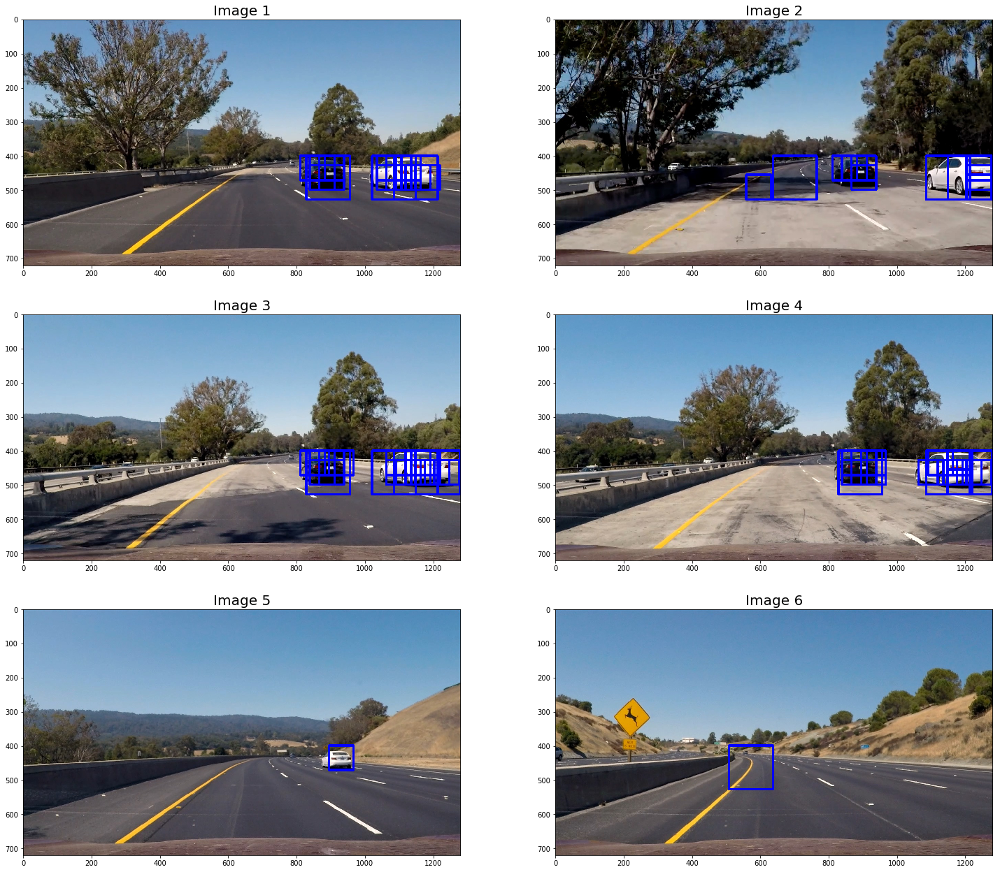

In [92]:
fig, axs = plt.subplots(3, 2, figsize=(25, 22))

for i, ax in enumerate(axs.flat):
    ax.imshow(hotWindowsTest[i])
    ax.set_title('Image {}'.format(i+1), fontsize=20)
plt.show()

### Video Implementation

In order to reduce the false positives and merge the bounding boxes around the vehicles, the heatmap is generated by counting the number of boxes in a region. This is then thresholded to get rid of false positives. Then, the remaining boxes are merged using `label()` function in `scipy`'s image module.

In [14]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 5)
    # Return the image
    return img

In [15]:
# load the test image
testImg = cv2.cvtColor(cv2.imread(testImgFiles[2]), cv2.COLOR_BGR2RGB)

# make a copy for showing the heat map
heat = np.zeros_like(testImg[:,:,0]).astype(np.float)

# get the bounding box list
box_list = getHotWindows(testImg, xLimits, yLimits, xyWindows, overlaps, svc, Xscalar)

# Add heat to each box in box list
heat = add_heat(heat, box_list)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(testImg), labels)

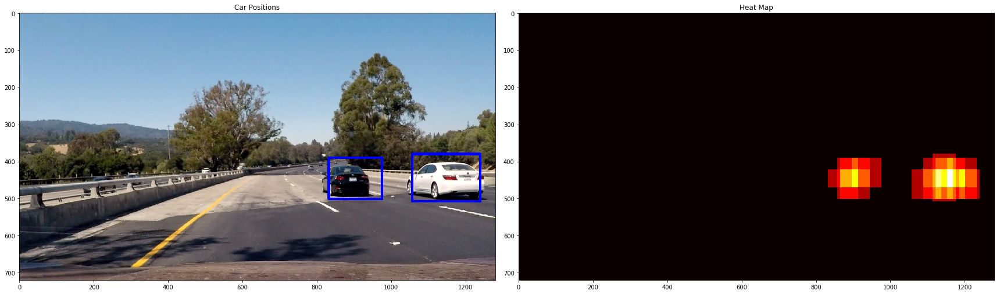

In [16]:
# draw them
fig = plt.figure(figsize=(24, 8))
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()

In [69]:
# define a video pipeline function that generates the same for video frames

def processFrame(img):
    
    # make a copy for showing the heat map
    heat = np.zeros_like(img[:,:,0]).astype(np.float)

    # get the bounding box list
    box_list = getHotWindows(img, xLimits, yLimits, xyWindows, overlaps, svc, Xscalar)

    # Add heat to each box in box list
    heat = add_heat(heat, box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,2)

    # Visualize the heatmap when displaying    
    # heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img

In [65]:
# test the processFrame on test images
testRes = [processFrame(cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)) for file in testImgFiles]

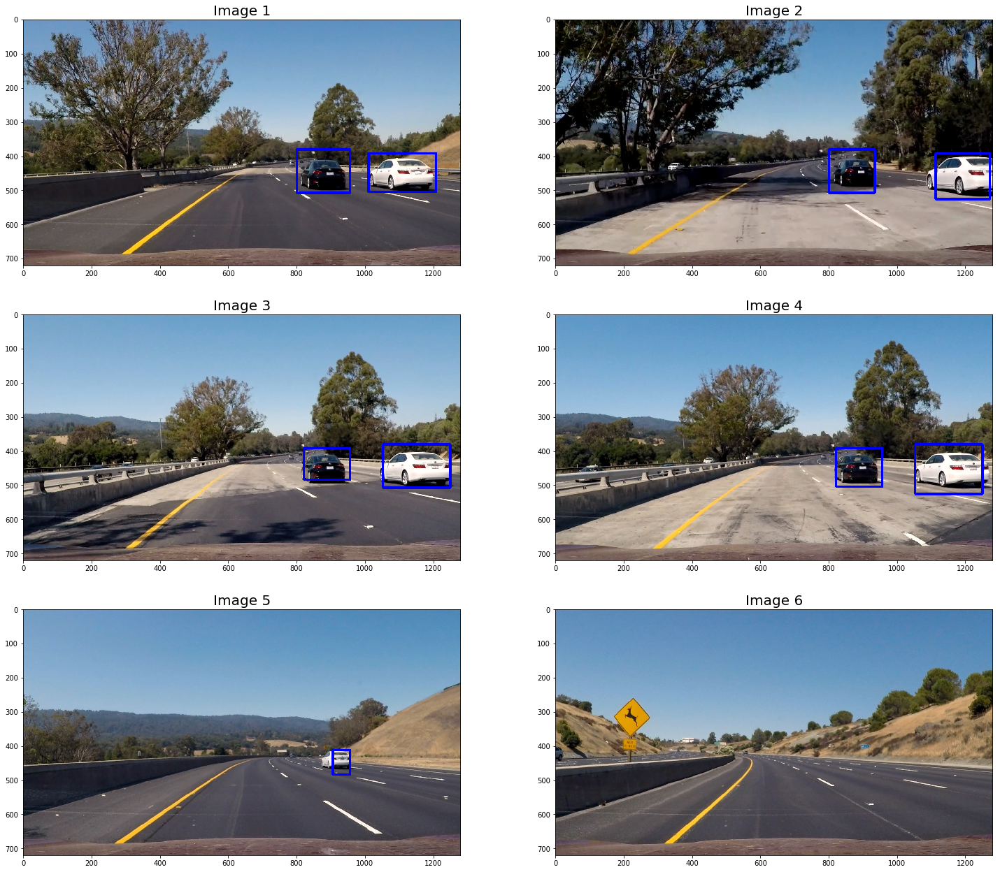

In [66]:
fig, axs = plt.subplots(3, 2, figsize=(25, 22))

for i, ax in enumerate(axs.flat):
    ax.imshow(testRes[i])
    ax.set_title('Image {}'.format(i+1), fontsize=20)
plt.show()

In [108]:
# Class to track the vehicles so that if there is only one box around, 
# then it can still detect it without any other false positives

class Tracker():
    def __init__(self, nFrames=10):
        self.prevBoxes = []
        self.framesToTrack = nFrames
        self.firstFrame = True
        
    def addBoxes(self, bboxes):
        self.prevBoxes.append(bboxes)
        if len(self.prevBoxes) > self.framesToTrack:
            self.prevBoxes = self.prevBoxes[1:]

In [111]:
# new processing function that would track the objects 
tracker = Tracker(4)
def trackFrame(img):
    # make a copy for showing the heat map
    heat = np.zeros_like(img[:,:,0]).astype(np.float)

    # get the bounding box list
    box_list = getHotWindows(img, xLimits, yLimits, xyWindows, overlaps, svc, Xscalar)
    
    if tracker.firstFrame:
        # use the simple thresholding
        if len(box_list) > 0: 
            heat = add_heat(heat, box_list)

            # Apply threshold to help remove false positives
            heat = apply_threshold(heat,1)
            tracker.firstFrame = False
    else:
        # use the tracker information for smooth detections
        if len(box_list) > 0:
            tracker.addBoxes(box_list)
            
        for box in tracker.prevBoxes:
            heat = add_heat(heat, box)
                
            # Apply threshold to help remove false positives
            heat = apply_threshold(heat, 1+len(tracker.prevBoxes)//2)


#     # Visualize the heatmap when displaying    
#     heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img

#### Test video pipeline

In [93]:
from moviepy.editor import VideoFileClip
test_out_file = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(processFrame)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4


 97%|█████████▋| 38/39 [00:33<00:00,  1.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 30.5 s, sys: 681 ms, total: 31.2 s
Wall time: 35.3 s


In [112]:
# modified processing function
test_out_file = 'test_video_out_adv.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(trackFrame)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video test_video_out_adv.mp4
[MoviePy] Writing video test_video_out_adv.mp4



 97%|█████████▋| 38/39 [00:32<00:00,  1.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out_adv.mp4 

CPU times: user 30.7 s, sys: 645 ms, total: 31.3 s
Wall time: 34.6 s


#### Video pipeline on the full video

In [98]:
video_out_file = 'project_video_out.mp4'
clip_video = VideoFileClip('project_video.mp4')
clip_video_out = clip_video.fl_image(processFrame)
%time clip_video_out.write_videofile(video_out_file, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [16:44<00:00,  1.23it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 15min 48s, sys: 17.6 s, total: 16min 6s
Wall time: 16min 46s


In [113]:
video_out_file_adv = 'project_video_out_adv.mp4'
clip_video = VideoFileClip('project_video.mp4')
clip_video_out_adv = clip_video.fl_image(trackFrame)
%time clip_video_out_adv.write_videofile(video_out_file_adv, audio=False)

[MoviePy] >>>> Building video project_video_out_adv.mp4
[MoviePy] Writing video project_video_out_adv.mp4



 12%|█▏        | 152/1261 [02:10<14:15,  1.30it/s]


 24%|██▍       | 303/1261 [04:13<13:03,  1.22it/s]


 36%|███▌      | 454/1261 [06:39<10:55,  1.23it/s]


 48%|████▊     | 605/1261 [08:43<08:18,  1.32it/s]


 60%|█████▉    | 756/1261 [10:57<07:34,  1.11it/s]


 72%|███████▏  | 907/1261 [13:23<05:10,  1.14it/s]


 84%|████████▍ | 1057/1261 [15:35<03:15,  1.04it/s]


 96%|█████████▌| 1205/1261 [18:03<00:47,  1.19it/s]


100%|█████████▉| 1260/1261 [18:55<00:01,  1.51s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out_adv.mp4 

CPU times: user 17min 17s, sys: 16.4 s, total: 17min 34s
Wall time: 18min 58s


It looks like there is some problem with the understanding oh HOG subsampling! There are weveral discussions on forums too related to this. This shall be investigated later. Currently, proceeding with the slower sliding window search. Ideally, none of this matters in when Deep LEarning is used. However, that shall be tried later as well.

In [62]:
# Do the hog sub sample over multiple scale, compare the time vs sliding window time
# !!!!! Apparently there is a problem with the subsampling step
# apply heap map and threshold it to get a single box
# the above two are the last two sections in the lecture code
# define the process imge function and apply it on the video file

(294, 2, 2)

In [55]:
# Define the hog subsampling to compare it with the sliding window search pipeline.
def hogSubsampling(img, yStart, yStop, scale, svc, Xscaler):
    
    img = img.astype(np.float32)/255
    
    imgToSearch = img[yStart:yStop, :, :]# note that the pipeline img is not read by cv2
    
    ctrans_tosearch = cv2.cvtColor(imgToSearch, cv2.COLOR_RGB2YUV)
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # load appropriate parameters once and for all
    pix_per_cell = FeatureExtractor.pixPerCell
    cell_per_block = FeatureExtractor.cellPerBlock
    orient = FeatureExtractor.orient
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 1  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = FeatureExtractor.getHogFeatures(ch1, featureVec=False)
    hog2 = FeatureExtractor.getHogFeatures(ch2, featureVec=False)
    hog3 = FeatureExtractor.getHogFeatures(ch3, featureVec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = FeatureExtractor.binSpatial(subimg)
            hist_features = FeatureExtractor.colorHist(subimg)

            # Scale features and make a prediction
            test_features = Xscaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            ssWindows = []
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                ssWindows.append(((xbox_left, ytop_draw+yStart),(xbox_left+win_draw,ytop_draw+win_draw+yStart)))
                
    return ssWindows

In [47]:
# function to get windows for multiple scales
def findCars(img, yStartList, yStopList, scales, svc, Xscaler, vis=False):
    # store all the windows obtained here
    bboxes = []
    # loop through different scales and corresponding y positions
    for i in range(len(scales)):
        bboxes.extend(hogSubsampling(img, yStartList[i], yStopList[i], scales[i], svc, Xscaler))
    print(len(bboxes))
    if vis:
        # draw boxes on this one
        draw_img = draw_boxes(img, bboxes)
        return draw_img
    
    return bboxes

In [62]:
# Apply the above function to the test images
import matplotlib.image as mpimg
yStartList = [400, 400]

yStopList = [656, 656]
scales = [1.5, 2]
t = time.time()
# hogSubsamplingTest = [findCars(cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB), yStartList, yStopList, scales, svc, Xscalar, vis=True) for file in testImgFiles]
# hogSubsamplingTest = [findCars(mpimg.imread(file), yStartList, yStopList, scales, svc, Xscalar, vis=True) for file in testImgFiles]
hogSubsamplingTest = [hogSubsampling(mpimg.imread(file), 360, 680, 1.5, svc, Xscalar) for file in testImgFiles]
print("Average time per frame {} s ...".format(round((time.time() - t)/len(testImgFiles), 2)))

Average time per frame 0.61 s ...


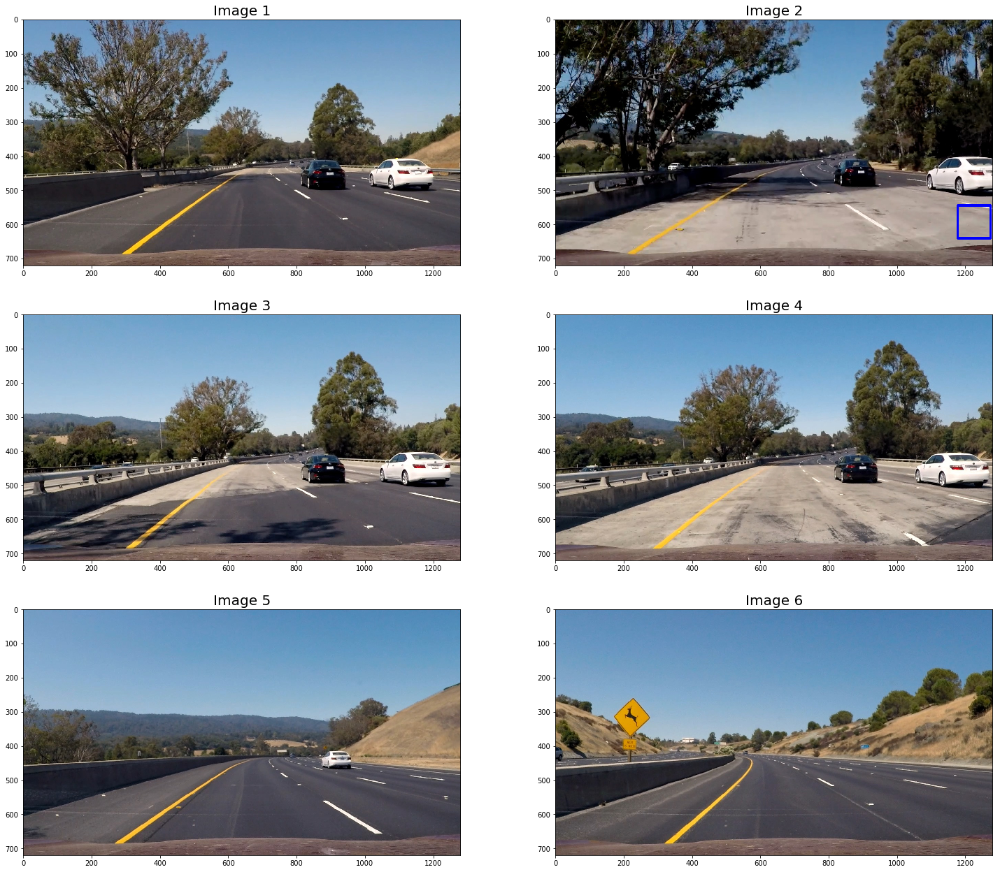

In [58]:
fig, axs = plt.subplots(3, 2, figsize=(25, 22))

for i, ax in enumerate(axs.flat):
    ax.imshow(hogSubsamplingTest[i])
    ax.set_title('Image {}'.format(i+1), fontsize=20)
plt.show()

In [70]:
testImg

array([[[ 48,  57,  64],
        [ 36,  46,  55],
        [ 33,  45,  57],
        ..., 
        [181, 182, 186],
        [215, 211, 208],
        [248, 241, 235]],

       [[ 29,  47,  61],
        [ 21,  40,  55],
        [ 62,  83, 100],
        ..., 
        [137, 153, 166],
        [155, 164, 173],
        [192, 197, 203]],

       [[ 11,  41,  65],
        [ 74, 106, 129],
        [125, 159, 186],
        ..., 
        [124, 155, 183],
        [132, 158, 181],
        [136, 158, 179]],

       ..., 
       [[ 75,  65,  64],
        [ 99,  87,  87],
        [100,  88,  88],
        ..., 
        [ 94,  77,  70],
        [106,  89,  82],
        [142, 125, 118]],

       [[ 65,  55,  54],
        [104,  92,  92],
        [107,  95,  95],
        ..., 
        [ 82,  64,  60],
        [101,  83,  79],
        [133, 118, 113]],

       [[ 34,  24,  23],
        [ 78,  68,  67],
        [112, 100, 100],
        ..., 
        [ 75,  57,  53],
        [116, 101,  96],
        [149, 134,

In [63]:
hogSubsamplingTest

[[], [], [], [], [], []]

In [72]:
testImgFiles

['test_images/test6.jpg',
 'test_images/test5.jpg',
 'test_images/test4.jpg',
 'test_images/test1.jpg',
 'test_images/test3.jpg',
 'test_images/test2.jpg']